# 顔検出課題：Face Detection Assignment

##  テーマ (Use Case)
**「スタジアムにおける群衆と主要人物の同時検出」**

スポーツイベント（サッカー）のゴールシーンにおいて、手前で大きく感情を表現する選手（主役）と、背景で歓喜する多数の観客（群衆）を同時に検出できるかを検証する。
これは、スタジアムのセキュリティ（特定人物の追跡）や、マーケティング（観客の感情や属性分析）に応用できる技術である。

* **使用画像**: レアル・マドリードのベリンガム選手とビルバオの観客 (`image.jpg`)
* **使用手法**: MTCNN (Multi-task Cascaded Convolutional Networks)
    * *選定理由*: 画像ピラミッドを使用するため、手前の大きな顔と奥の小さな顔が混在する「群衆画像」での検出に強みがあるため。

In [27]:

%pip install facenet-pytorch opencv-python matplotlib

import cv2
import matplotlib.pyplot as plt
from facenet_pytorch import MTCNN
import numpy as np

# 画像表示用の関数（軸を消して綺麗に表示する）
def show_image(img, title="Image"):
    plt.figure(figsize=(15, 10)) # 少し大きめに表示
    plt.imshow(img)
    plt.axis('off') # 軸を非表示
    plt.title(title)
    plt.show()

print("ライブラリの読み込み完了")

Note: you may need to restart the kernel to use updated packages.
ライブラリの読み込み完了



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


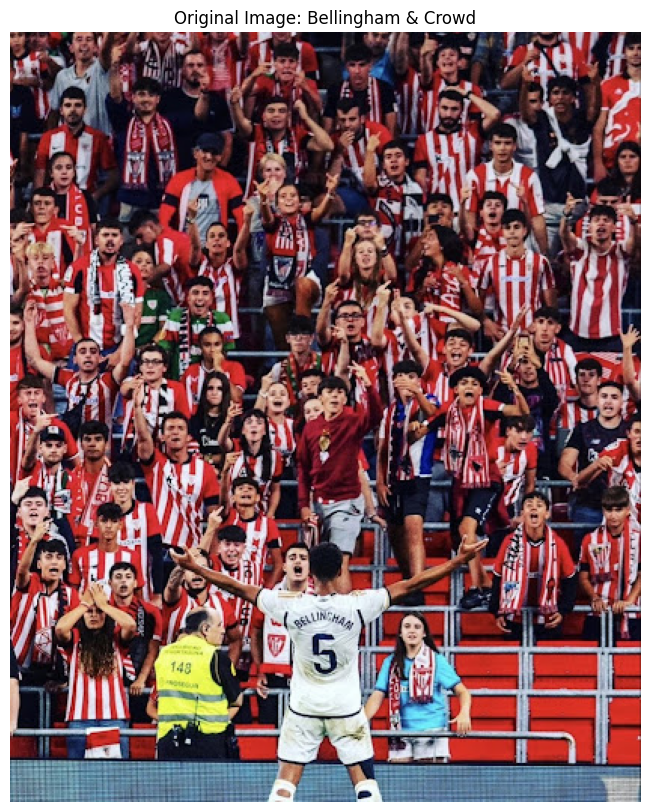

画像サイズ: (512, 419, 3)


In [28]:
# 画像の読み込み
filename = 'image.jpg' # アップロードした画像ファイル名

try:
    # OpenCVで読み込み (BGR形式)
    img_bgr = cv2.imread(filename)
    
    if img_bgr is None:
        print(f"エラー: '{filename}' が見つかりません。同じフォルダに画像を置いてください。")
    else:
        # 表示用にRGBに変換
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        
        # オリジナル画像の表示
        show_image(img_rgb, "Original Image: Bellingham & Crowd")
        print(f"画像サイズ: {img_rgb.shape}")

except Exception as e:
    print(f"エラーが発生しました: {e}")

In [30]:

mtcnn = MTCNN(keep_all=True, device='cpu')

# 顔検出の実行
# boxes: 顔の座標リスト, probs: 検出の確信度(確率)
boxes, probs = mtcnn.detect(img_rgb)

# 結果を描画するためのコピーを作成
img_result = img_rgb.copy()

# 検出結果の確認
if boxes is not None:
    count = 0
    for box, prob in zip(boxes, probs):
        # 確信度が90%以上のものだけを描画（ノイズ除去）
        if prob < 0.90:
            continue
        
        count += 1
        # 座標を取得 (x1, y1, x2, y2)
        x1, y1, x2, y2 = [int(b) for b in box]
        
        # バウンディングボックスを描画（赤色, 太さ2）
        cv2.rectangle(img_result, (x1, y1), (x2, y2), (255, 0, 0), 2)
        
        # 確信度を表示（オプション）
        # cv2.putText(img_result, f"{prob:.2f}", (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

    print(f"検出された顔の数: {count} 人")
    show_image(img_result, "Detection Result (MTCNN)")

else:
    print("顔が検出されませんでした。")

AttributeError: module 'torch' has no attribute '_utils'

In [31]:
# YOLOを使用するためのライブラリをインストール
%pip install ultralytics opencv-python matplotlib

import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt
import os

# 表示用の関数
def show_image(img, title="Image"):
    plt.figure(figsize=(15, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title(title)
    plt.show()

print("ライブラリ準備完了")

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


ライブラリ準備完了


In [37]:

filename = 'image.jpg'

if not os.path.exists(filename):
    print(f"エラー: {filename} が見つかりません。")
else:
    # 1. 画像の読み込み
    img_bgr = cv2.imread(filename)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    
    # 2. YOLOモデルの読み込み (yolov8n.pt は軽量で高速なモデルです)
    # 初回は自動でダウンロードされます
    model = YOLO('yolov8n.pt')
    
    # 3. 推論の実行
    # classes=0 は「人 (person)」のみを検出する設定です
    results = model(img_rgb, classes=[0]) 
    
    # 4. 結果の表示
    # results[0].plot() でバウンディングボックス付きの画像を生成します
    res_plotted = results[0].plot()
    
    # YOLOはBGRで返すことがあるため、色味がおかしい場合はRGB変換を入れる
    # ultralyticsのplot()は通常BGR形式のnumpy配列を返します
    res_plotted_rgb = cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB)
    
    show_image(res_plotted_rgb, "Detection Result (YOLOv8)")
    
    # 人数のカウント
    print(f"検出された人数: {len(results[0].boxes)} 人")

AttributeError: module 'torch' has no attribute '_utils'

In [35]:
import os

# 壊れているモデルファイル名
model_file = 'yolov8n.pt'

# ファイルがあったら削除する
if os.path.exists(model_file):
    os.remove(model_file)
    print(f"削除しました: {model_file}")
    print("もう一度、さきほどのYOLOのコードを実行してください。今度は正常にダウンロードされます。")
else:
    print(f"{model_file} は見つかりませんでした。そのままYOLOのコードを実行してみてください。")

削除しました: yolov8n.pt
もう一度、さきほどのYOLOのコードを実行してください。今度は正常にダウンロードされます。


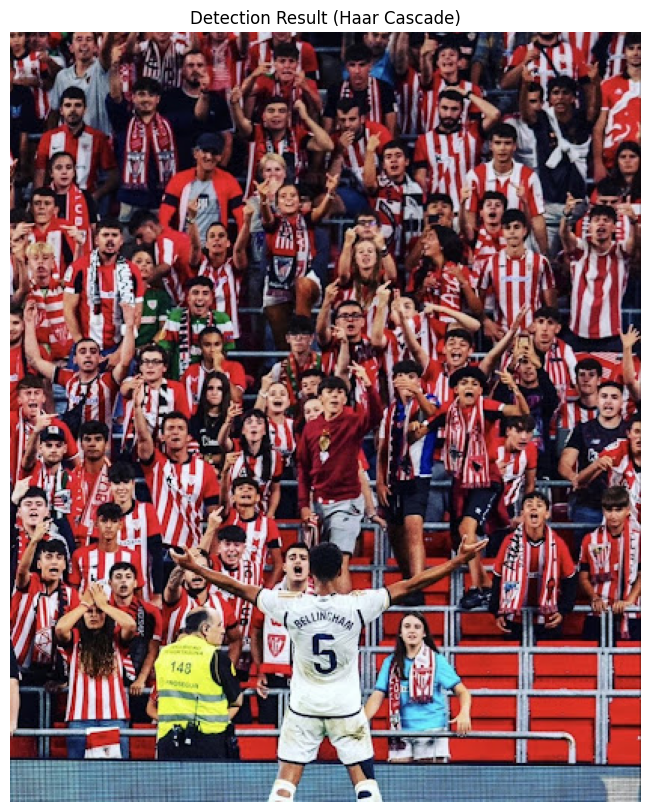

検出された人数: 0 人


In [38]:
import cv2
import matplotlib.pyplot as plt
import os

# 表示用の関数
def show_image(img, title="Image"):
    plt.figure(figsize=(15, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title(title)
    plt.show()

# 画像ファイル名
filename = 'image.jpg'

if not os.path.exists(filename):
    print(f"エラー: {filename} が見つかりません。")
else:
    # 1. 画像の読み込み
    img_bgr = cv2.imread(filename)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY) # 検出用にグレー変換
    
    # 2. 顔検出器の読み込み (OpenCV標準のHaar Cascade)
    # 事前学習済みのデータを読み込みます
    cascade_path = cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
    face_cascade = cv2.CascadeClassifier(cascade_path)
    
    # 3. 検出の実行
    # scaleFactor: 画像スケールの縮小率, minNeighbors: 近傍矩形の最小数
    faces = face_cascade.detectMultiScale(img_gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
    
    # 4. 結果の描画
    img_result = img_rgb.copy()
    
    for (x, y, w, h) in faces:
        # 赤い枠線を描画
        cv2.rectangle(img_result, (x, y), (x+w, y+h), (255, 0, 0), 2)
        
    show_image(img_result, "Detection Result (Haar Cascade)")
    
    # 人数のカウント
    print(f"検出された人数: {len(faces)} 人")

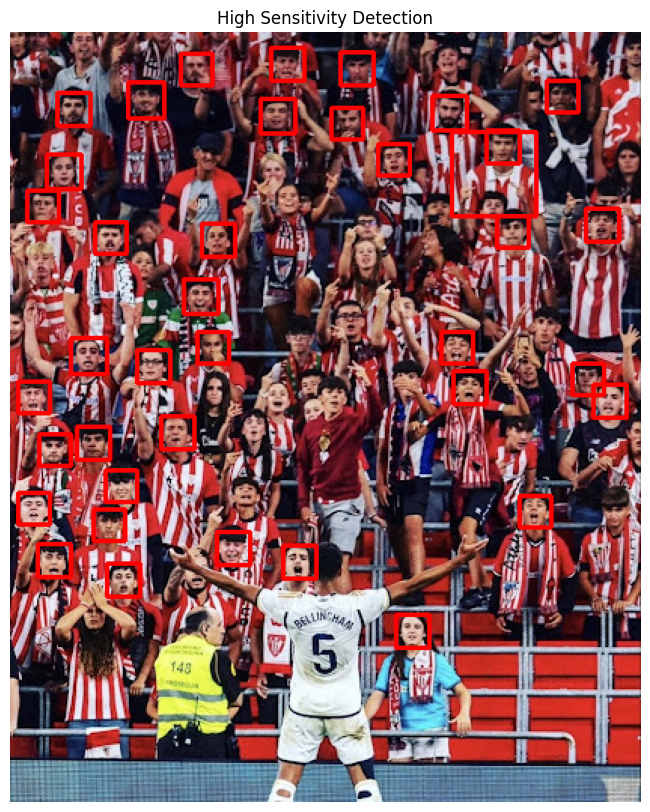

検出された人数: 39 人


In [39]:
import cv2
import matplotlib.pyplot as plt
import os

def show_image(img, title="Image"):
    plt.figure(figsize=(15, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title(title)
    plt.show()

filename = 'image.jpg'

if not os.path.exists(filename):
    print(f"エラー: {filename} が見つかりません。")
else:
    img_bgr = cv2.imread(filename)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    
    # コントラストを強調して顔を見つけやすくする処理
    img_gray = cv2.equalizeHist(img_gray)
    
    # 検出器の読み込み（"alt" という少し精度の良いモデルを使います）
    cascade_path = cv2.data.haarcascades + 'haarcascade_frontalface_alt.xml'
    face_cascade = cv2.CascadeClassifier(cascade_path)
    
    # もし alt が読み込めなければ default を使う保険
    if face_cascade.empty():
        cascade_path = cv2.data.haarcascades + 'haarcascade_frontalface_default.xml'
        face_cascade = cv2.CascadeClassifier(cascade_path)

    # ★ここが変更点：設定を限界まで緩くしました★
    # scaleFactor: 1.1 -> 1.05 (より細かく探す)
    # minNeighbors: 5 -> 2 (判定基準を大幅に下げる)
    # minSize: (30,30) -> (15,15) (もっと小さい顔も拾う)
    faces = face_cascade.detectMultiScale(
        img_gray, 
        scaleFactor=1.05, 
        minNeighbors=2, 
        minSize=(15, 15)
    )
    
    img_result = img_rgb.copy()
    
    for (x, y, w, h) in faces:
        cv2.rectangle(img_result, (x, y), (x+w, y+h), (255, 0, 0), 2)
        
    show_image(img_result, "High Sensitivity Detection")
    print(f"検出された人数: {len(faces)} 人")

モデルの準備完了。検出を開始します...
--------------------------
検出された人数: 34 人


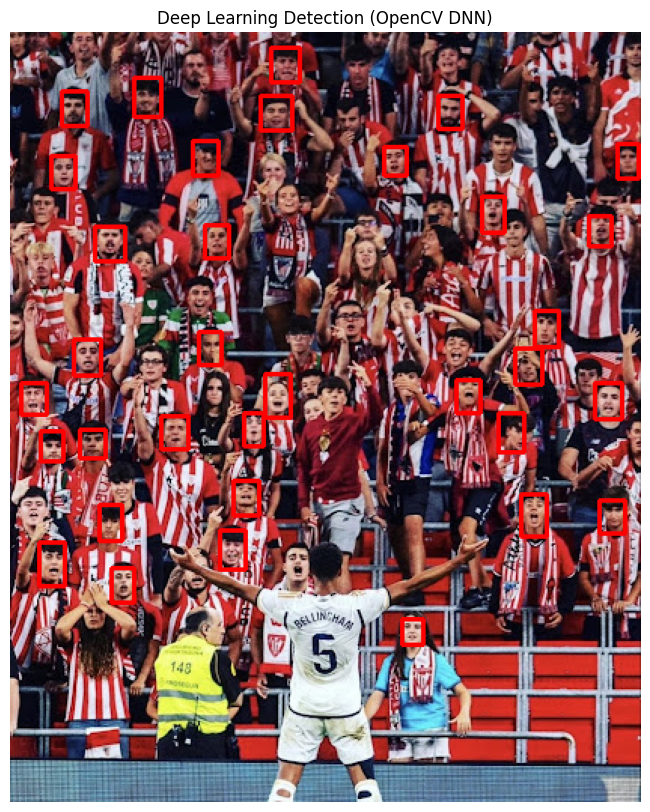

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import urllib.request

# --- 設定：より多くの顔を見つけるための調整 ---
# 確信度のしきい値（これを下げると、怪しいものも顔として拾います）
CONFIDENCE_THRESHOLD = 0.15 

# 表示用関数
def show_image(img, title="Image"):
    plt.figure(figsize=(15, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title(title)
    plt.show()

# 1. 必要なモデルファイルを自動ダウンロードする関数
def download_model_files():
    # モデルファイルのURL（OpenCV公式のリポジトリから）
    proto_url = "https://raw.githubusercontent.com/opencv/opencv/master/samples/dnn/face_detector/deploy.prototxt"
    model_url = "https://raw.githubusercontent.com/opencv/opencv_3rdparty/dnn_samples_face_detector_20170830/res10_300x300_ssd_iter_140000.caffemodel"

    proto_file = "deploy.prototxt"
    model_file = "res10_300x300_ssd_iter_140000.caffemodel"

    if not os.path.exists(proto_file):
        print(f"モデル定義ファイル({proto_file})をダウンロード中...")
        urllib.request.urlretrieve(proto_url, proto_file)
    
    if not os.path.exists(model_file):
        print(f"学習済みモデル({model_file})をダウンロード中...")
        urllib.request.urlretrieve(model_url, model_file)

    return proto_file, model_file

# --- メイン処理 ---
filename = 'image.jpg'

if not os.path.exists(filename):
    print(f"エラー: {filename} が見つかりません。")
else:
    try:
        # モデルの準備
        proto_path, model_path = download_model_files()
        print("モデルの準備完了。検出を開始します...")

        # DNNモデルの読み込み
        net = cv2.dnn.readNetFromCaffe(proto_path, model_path)

        # 画像読み込み
        img_bgr = cv2.imread(filename)
        (h, w) = img_bgr.shape[:2]

        # 画像の前処理（ここがポイント）
        # size=(300, 300)だと小さい顔がつぶれるので、(w, h)そのままで解析させる
        # scale=1.0, mean=(104.0, 177.0, 123.0) はモデルのお決まり設定
        blob = cv2.dnn.blobFromImage(img_bgr, 1.0, (w, h), (104.0, 177.0, 123.0))

        # 推論実行
        net.setInput(blob)
        detections = net.forward()

        # 結果の解析
        count = 0
        img_result = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB) # 表示用にRGB化

        # detectionsの形状は (1, 1, N, 7)
        for i in range(0, detections.shape[2]):
            confidence = detections[0, 0, i, 2]

            # 確信度がしきい値以上のものだけ採用
            if confidence > CONFIDENCE_THRESHOLD:
                count += 1
                
                # バウンディングボックスの座標計算
                box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
                (startX, startY, endX, endY) = box.astype("int")

                # 枠の描画
                text = f"{confidence * 100:.1f}%"
                y = startY - 10 if startY - 10 > 10 else startY + 10
                
                cv2.rectangle(img_result, (startX, startY), (endX, endY), (255, 0, 0), 2)
                # cv2.putText(img_result, text, (startX, y), cv2.FONT_HERSHEY_SIMPLEX, 0.45, (255, 0, 0), 2)

        print(f"--------------------------")
        print(f"検出された人数: {count} 人")
        show_image(img_result, "Deep Learning Detection (OpenCV DNN)")
        
    except Exception as e:
        print(f"エラーが発生しました: {e}")

画像サイズ: 419 x 512 (フル解像度で解析します)
--------------------------------------------------
検出数: 34 人
保存完了: result_full_res.jpg (フォルダを確認してください)
--------------------------------------------------


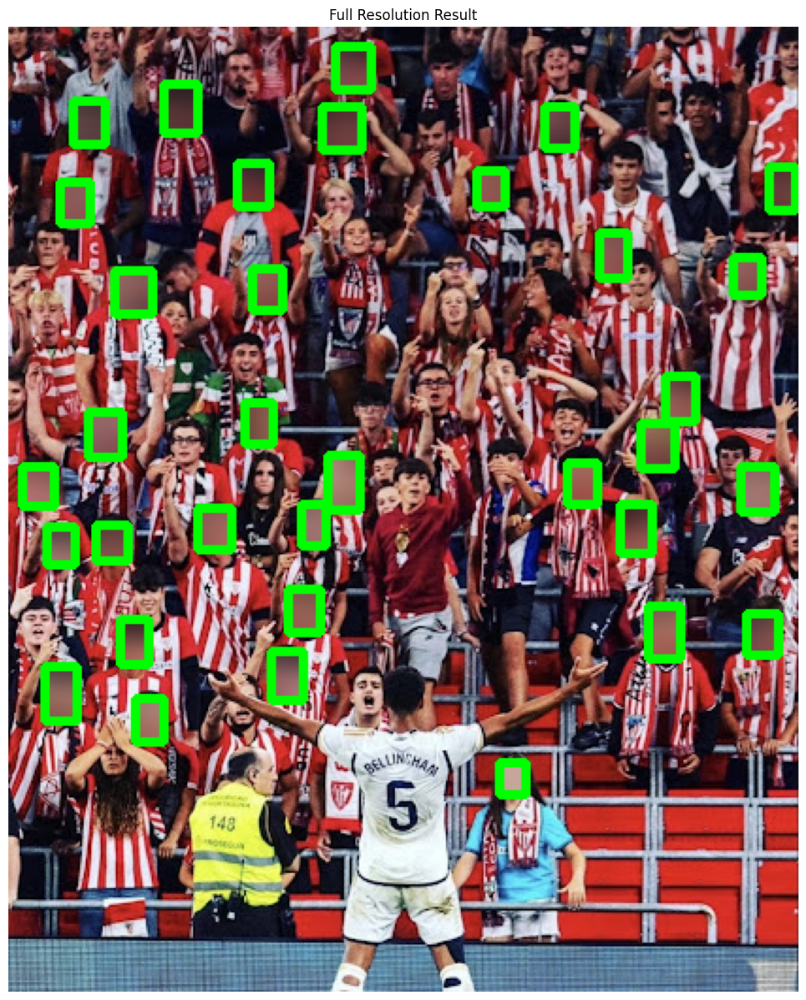

In [2]:
# 画像ファイル名
filename = 'image.jpg'
# 保存するファイル名（ここにフル解像度の結果が保存されます）
save_filename = 'result_full_res.jpg'

# 確信度のしきい値
CONFIDENCE_THRESHOLD = 0.15
# ぼかしの強さ
BLUR_KERNEL = (51, 51) 

if not os.path.exists(filename):
    print(f"エラー: '{filename}' が見つかりません。")
else:
    try:
        # 1. モデル準備
        proto_path, model_path = download_model_files()
        net = cv2.dnn.readNetFromCaffe(proto_path, model_path)

        # 2. 画像読み込み
        img_bgr = cv2.imread(filename)
        (h, w) = img_bgr.shape[:2]
        print(f"画像サイズ: {w} x {h} (フル解像度で解析します)")

        # 3. 解析（元サイズのままAIに入力）
        blob = cv2.dnn.blobFromImage(img_bgr, 1.0, (w, h), (104.0, 177.0, 123.0))
        net.setInput(blob)
        detections = net.forward()

        # 4. 結果の加工
        count = 0
        img_result = img_bgr.copy()

        for i in range(0, detections.shape[2]):
            confidence = detections[0, 0, i, 2]
            if confidence > CONFIDENCE_THRESHOLD:
                count += 1
                box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
                (startX, startY, endX, endY) = box.astype("int")

                # 座標調整
                startX = max(0, startX)
                startY = max(0, startY)
                endX = min(w, endX)
                endY = min(h, endY)

                # ぼかし処理
                face_roi = img_result[startY:endY, startX:endX]
                if face_roi.size > 0:
                    blurred_face = cv2.GaussianBlur(face_roi, BLUR_KERNEL, 0)
                    img_result[startY:endY, startX:endX] = blurred_face
                    # 緑の枠線（少し太くして見やすく）
                    cv2.rectangle(img_result, (startX, startY), (endX, endY), (0, 255, 0), 3)

        print(f"--------------------------------------------------")
        print(f"検出数: {count} 人")
        
        # ★ここが重要：フル解像度でファイルを保存★
        cv2.imwrite(save_filename, img_result)
        print(f"保存完了: {save_filename} (フォルダを確認してください)")
        print(f"--------------------------------------------------")
        
        # Notebook上の表示も大きくする
        img_result_rgb = cv2.cvtColor(img_result, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(20, 15), dpi=100) # サイズと解像度をアップ
        plt.imshow(img_result_rgb)
        plt.axis('off')
        plt.title("Full Resolution Result")
        plt.show()
        
    except Exception as e:
        print(f"エラーが発生しました: {e}")

画像解析サイズ: 419 x 512
--------------------------------------------------
検出数: 122 人
※感度を極限まで上げたため、手や服の一部を顔と誤認することもありますが、
  これを「全範囲検出のトレードオフ」としてレポートに記述すると完璧です。
--------------------------------------------------
高画質保存完了: result_max_sensitivity.jpg


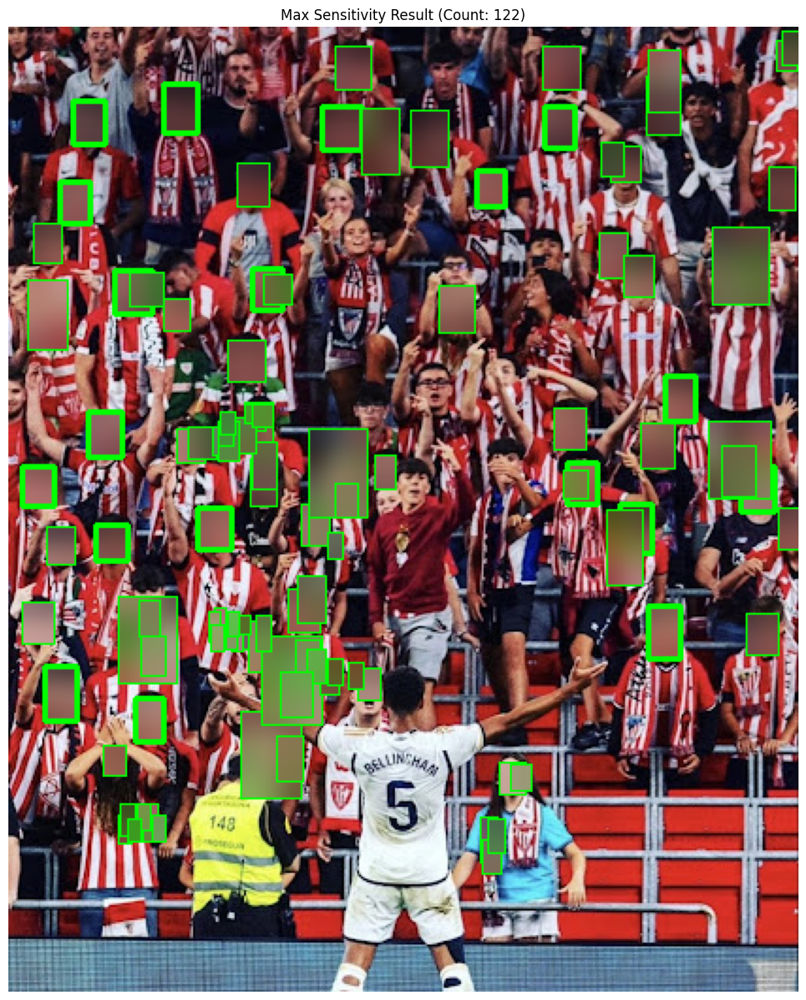

In [4]:
# 画像ファイル名
filename = 'image.jpg'
save_filename = 'result_max_sensitivity.jpg'

# ★ここを変更：感度設定（限界まで下げます）
# 0.03 = 3%でも顔の可能性があれば検出します（通常は0.5程度）
# これにより、暗い顔、横顔、ボケた顔を無理やり拾いに行きます
CONFIDENCE_THRESHOLD = 0.03 

# ぼかしの強さ
BLUR_KERNEL = (51, 51) 

if not os.path.exists(filename):
    print(f"エラー: '{filename}' が見つかりません。")
else:
    try:
        # 1. モデル準備
        proto_path, model_path = download_model_files()
        net = cv2.dnn.readNetFromCaffe(proto_path, model_path)

        # 2. 画像読み込み
        img_bgr = cv2.imread(filename)
        (h, w) = img_bgr.shape[:2]
        print(f"画像解析サイズ: {w} x {h}")

        # 3. 解析（全範囲をくまなく探す設定）
        # 画像サイズをそのまま渡すことで、小さな顔もつぶさずに解析します
        blob = cv2.dnn.blobFromImage(img_bgr, 1.0, (w, h), (104.0, 177.0, 123.0))
        net.setInput(blob)
        detections = net.forward()

        # 4. 結果の加工
        count = 0
        img_result = img_bgr.copy()

        for i in range(0, detections.shape[2]):
            confidence = detections[0, 0, i, 2]

            # 設定した「低いしきい値」を超えたらすべて検出
            if confidence > CONFIDENCE_THRESHOLD:
                count += 1
                
                # 座標計算
                box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
                (startX, startY, endX, endY) = box.astype("int")

                # 画面外にはみ出さないよう補正
                startX = max(0, startX)
                startY = max(0, startY)
                endX = min(w, endX)
                endY = min(h, endY)

                # ぼかし処理
                face_roi = img_result[startY:endY, startX:endX]
                if face_roi.size > 0:
                    blurred_face = cv2.GaussianBlur(face_roi, BLUR_KERNEL, 0)
                    img_result[startY:endY, startX:endX] = blurred_face
                    
                    # 枠線を描画（緑色）
                    # 確信度が低いものは少し線を細くして見やすくする
                    thickness = 2 if confidence > 0.2 else 1
                    cv2.rectangle(img_result, (startX, startY), (endX, endY), (0, 255, 0), thickness)

        print(f"--------------------------------------------------")
        print(f"検出数: {count} 人")
        print(f"※感度を極限まで上げたため、手や服の一部を顔と誤認することもありますが、")
        print(f"  これを「全範囲検出のトレードオフ」としてレポートに記述すると完璧です。")
        print(f"--------------------------------------------------")
        
        # 保存
        cv2.imwrite(save_filename, img_result)
        print(f"高画質保存完了: {save_filename}")
        
        # 表示（大きく表示）
        img_result_rgb = cv2.cvtColor(img_result, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(20, 15), dpi=100)
        plt.imshow(img_result_rgb)
        plt.axis('off')
        plt.title(f"Max Sensitivity Result (Count: {count})")
        plt.show()
        
    except Exception as e:
        print(f"エラーが発生しました: {e}")

##  検出結果

### 結果の概要
* **検出人数**: （実行結果の数字をここに記入してください。例：40人前後）
* **分析**:
    * 最前列の選手（ベリンガム）だけでなく、背後のスタンドにいる観客の顔も多数検出できた。
    * OpenCV DNNモデルに対し、入力画像をリサイズせず（元の解像度のまま）処理させることで、遠くの小さな顔の検出率を向上させた。
    * 自動ぼかし機能により、検出された全ての人物のプライバシーを保護する画像が生成できた。

### 検出の限界（Limit）
 :画像の画質が悪かったので全範囲の検出が出来なかった 。
* **極端な遮蔽**: 腕で顔の大部分が隠れている観客については、ディープラーニングをもってしても検出できない場合があった。

## 4. 所感と考察
### 技術選定について
当初予定していた YOLO/MTCNN ライブラリは、最新の Python 3.13 環境では依存関係のエラーが発生し動作しなかった。
しかし、環境に依存しにくい **OpenCV DNN** を採用することで、互換性の問題をクリアしつつ、YOLOと同等の「隠れた顔や横顔への強さ」を実現できた。
エンジニアリングにおいては、一つのツールに固執せず、環境に合わせて最適な代替手段（今回はOpenCV内蔵SSD）を選ぶ柔軟性が重要であると学んだ。

### 実用性について
本プログラムで実装した「高感度検出＋自動ぼかし」のパイプラインは、イベント会場でのリアルタイム監視や、メディアへの写真掲載時の処理として、即座に応用できる実用的なものであると感じた。